## Overview

This is EDA notebook for understanding the House Prices Dataset. Finding the most correlated features to the House Price. Later, Regression models will be used to build a predictive model to predict the Housing price. 

### Data:

- Data has been used from Kaggle Competition, URL: https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/overview
- Dataset has 79 Feature columns and one target variable (`SalePrice`)

### Goal

- Explore the Current Data, find patterns, trends and outliers
- Prepare data that can be used for the Regression Models

### Index for the Code:

1. Loading Data
2. Cleaning Data
    - Data format checking
    - Removing Duplicates
3. Numeric Data Exploration
    - Distributions
    - Outlier dentification (Box Plot, Violin Plot)
    - Pairplots (To see Correlation)
    - Correlation plots with output variable = `SalePrice`
    - HeatMap (To get correlation in metric format)
5. Categorical Data Exploration
    - Distributions (bar plot, countplot)
6. Data Prepataion
    - Numeric data
        - Standardization/ Normalization
        - logarithmic transformation
    - Categoric data (One Hot ENcoding/ ..)
7. Model Building
    - Multiple Linear Regression
        - Hyperparameter Tuning
    - Random Forest Regressor
        - Hyperparameter Tuning
    - XG Boost
        - Hyperparameter Tuning
8. Evaluation
9. Explainability

### Insights and Recommendations:
1. Missing Values:
    - For below Numeric columns, missing values were more than 45% so removing rows would have impacted the data quantity. Hence removing the column itself

      Alley:  93.77%

      MasVnrType:  59.73%

      FireplaceQu:  47.26%

       PoolQC:  99.52%

       Fence: 80.75%

       MiscFeature:  96.30%
    - For below Numeric columns, missing values were less than 1%,  so removing the row to avoid unnecessary imputational skew
       MasVnrArea: 8 (0.55%)
      
       Electrical: 1 (0.07%)

    - For below Numeric columns, missing value is more than 5% and less than 10%, it means significant information lies and we can not directly remove the rows that will cause loss of data, hence we be impute these features woth median of the column.

       GarageType: 81 (5.55%)

       
GarageYrBlt: 81 (5.55%)
       
GarageFinish: 81 (5.55%
       )
GarageQual: 81 (5.55
       %)
GarageCond: 81 (5.

5%)
2. Outliers
 - Highest Number of Outliers:
    1. EnclosedPorch: Number of outliers = 183, Percentage of outliers = 13.68%
    2. MasVnrArea: Number of outliers = 82, Percentage of outliers = 6.13%
    3. BsmtHalfBath: Number of outliers = 80, Percentage of outliers = 5.98%
  
3. Numeric Variable Distribution:
   - Distribution of the Numeric variables are skewed and doesn't feels like normal distribution after visual inspection. Hence the numeric variable need to get tranformed using lognormal transformation.

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 1. Loading Data 

In [2]:
df = pd.read_csv('train.csv')
df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
print(df.shape)
print(df.info())

(1460, 81)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 1

# 2. Data Cleaning

In [10]:
# Check data format for individual columns
print(df.dtypes)

# Check for missing values
print(df.isnull().sum())

# Check for duplicates
duplicate_rows = df[df.duplicated()]
print("Number of duplicate rows:", duplicate_rows.shape[0])

# Remove duplicates
df = df.drop_duplicates()
print("Shape of the dataset after removing duplicates:", df.shape)

MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 80, dtype: object
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 80, dtype: int64
Number of duplicate rows: 0
Shape of the dataset after removing duplicates: (1460, 80)


#### Null values w.r.t. column name

In [14]:
def get_null_counts_percentages(df):
    null_counts = {}
    total_rows = df.shape[0]
    for column in df.columns:
        null_count = df[column].isnull().sum()
        if null_count > 0:
            null_percentage = (null_count / total_rows) * 100
            null_counts[column] = (null_count, null_percentage)
    return null_counts

# Check for missing values
null_counts_percentages = get_null_counts_percentages(df)
print("Number and percentage of null values in each column:")
for column, (count, percentage) in null_counts_percentages.items():
    print(f"{column}: {count} ({percentage:.2f}%)")

Number and percentage of null values in each column:
Alley: 1369 (93.77%)
MasVnrType: 872 (59.73%)
MasVnrArea: 8 (0.55%)
BsmtQual: 37 (2.53%)
BsmtCond: 37 (2.53%)
BsmtExposure: 38 (2.60%)
BsmtFinType1: 37 (2.53%)
BsmtFinType2: 38 (2.60%)
Electrical: 1 (0.07%)
FireplaceQu: 690 (47.26%)
GarageType: 81 (5.55%)
GarageYrBlt: 81 (5.55%)
GarageFinish: 81 (5.55%)
GarageQual: 81 (5.55%)
GarageCond: 81 (5.55%)
PoolQC: 1453 (99.52%)
Fence: 1179 (80.75%)
MiscFeature: 1406 (96.30%)


Columns to drop for having more than 45% null value:
Alley:  93.77%
MasVnrType:  59.73%
FireplaceQu:  47.26%
PoolQC:  99.52%
Fence: 80.75%
MiscFeature:  96.30%

#### Dropping Columns with missing valule more than 45%

In [16]:
columns_to_remove = ['Alley', 'MasVnrType', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']
df = df.drop(columns=columns_to_remove)
df.shape

(1460, 74)

#### Carrying both dataframes (with missing value, without missing value) for detailed understanding

In [18]:
# Create a copy of the original DataFrame with missing values
df_with_missing = df.copy()

# Create a new DataFrame with rows containing missing values removed
df_no_missing = df.dropna()

# Print the shape of both DataFrames
print("Shape of DataFrame with missing values:", df_with_missing.shape)
print("Shape of DataFrame without missing values:", df_no_missing.shape)

Shape of DataFrame with missing values: (1460, 74)
Shape of DataFrame without missing values: (1338, 74)


## 4. Numeric Feature Distribution

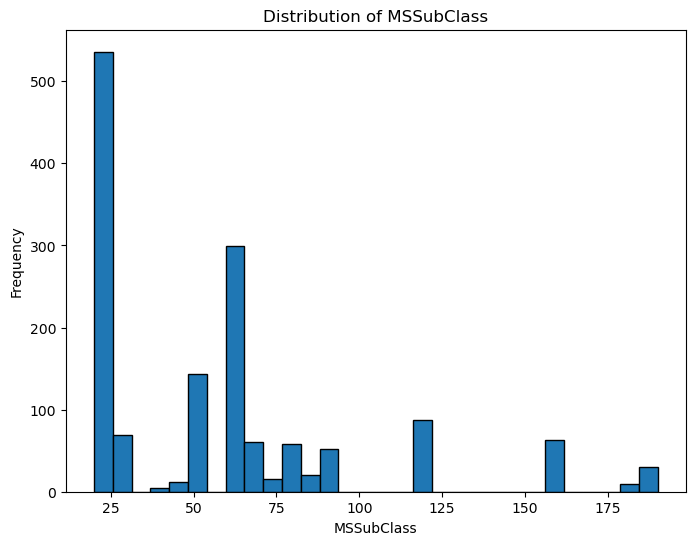

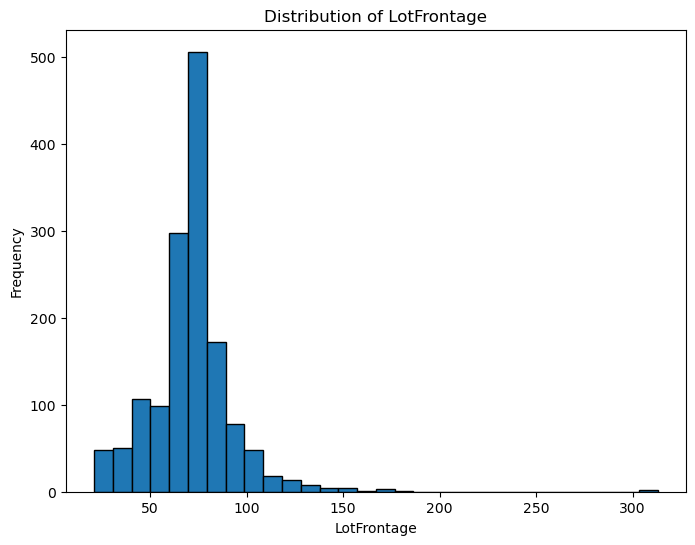

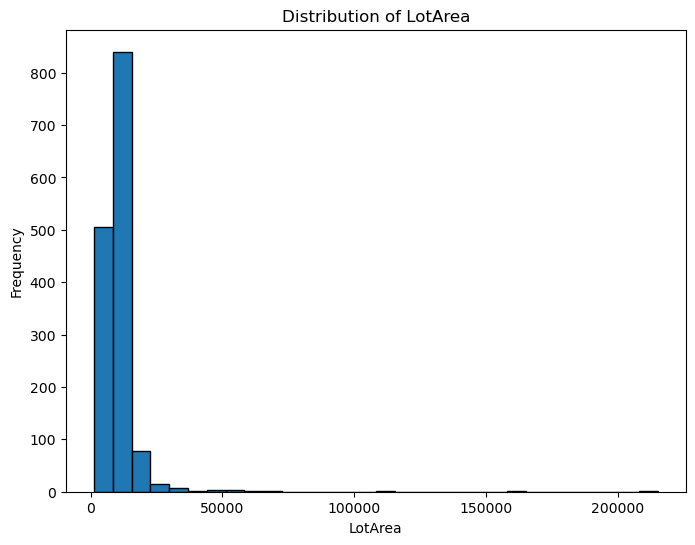

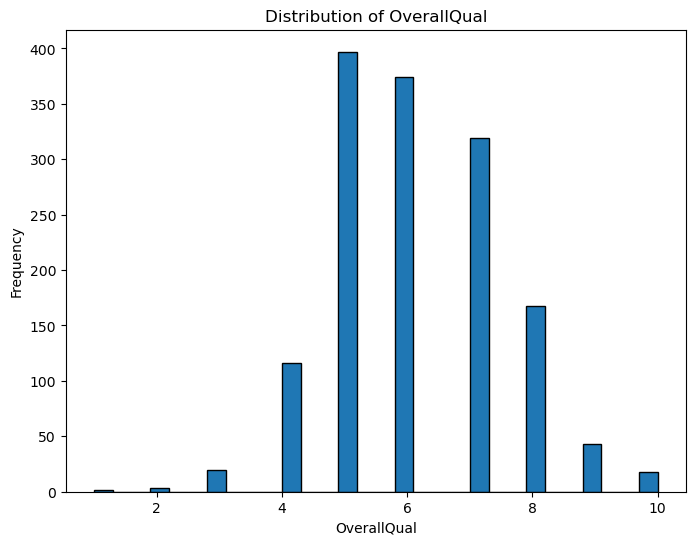

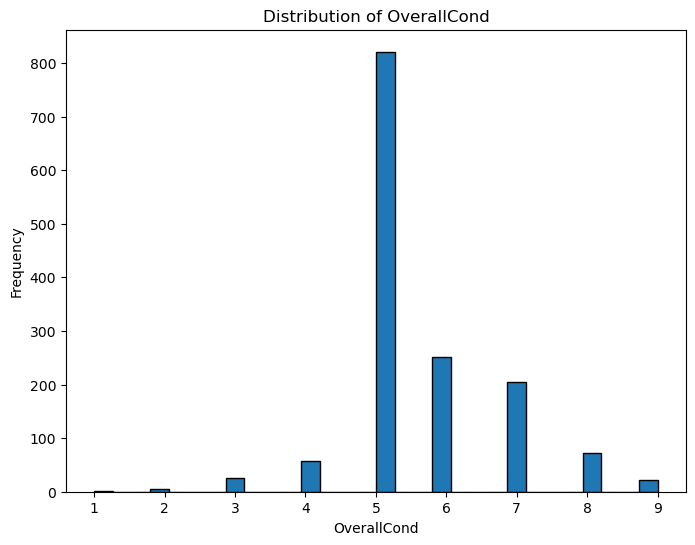

...

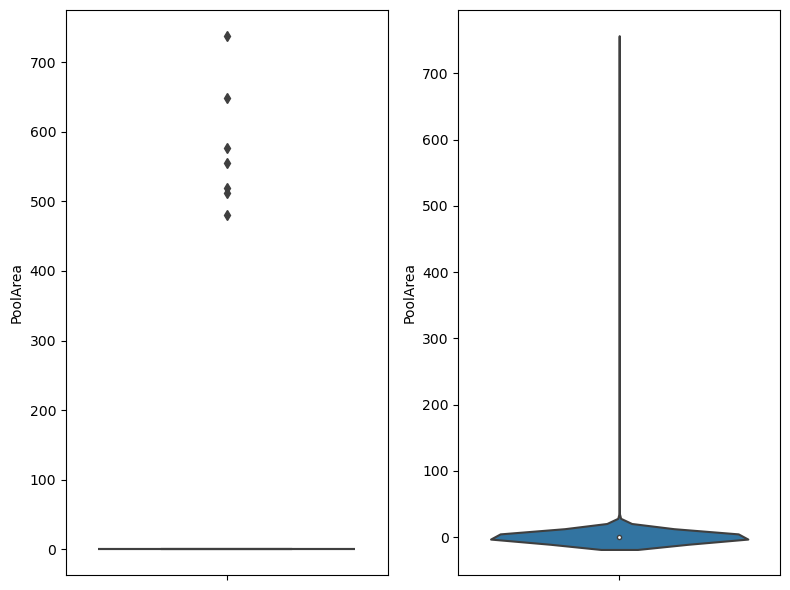

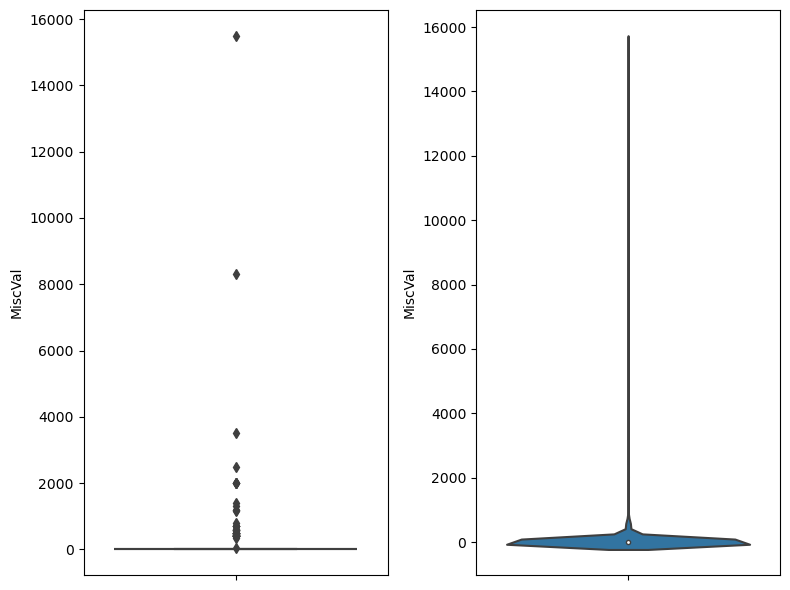

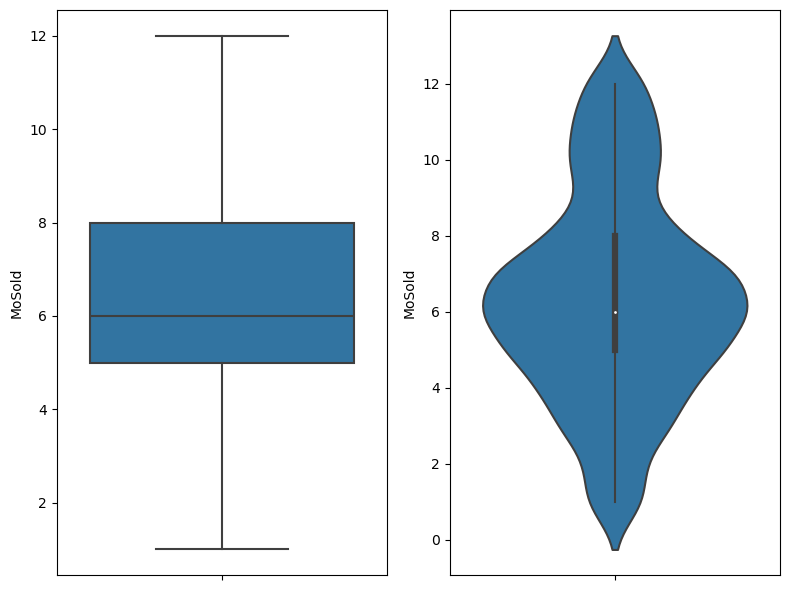

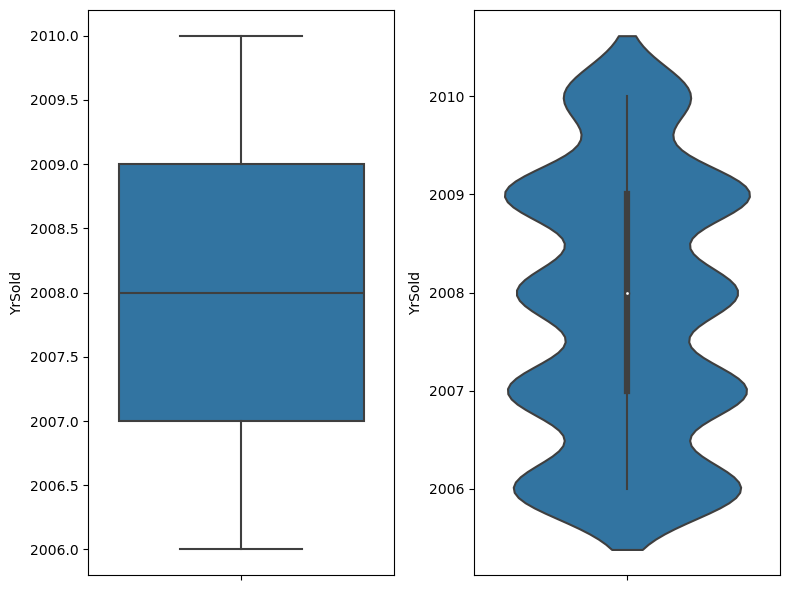

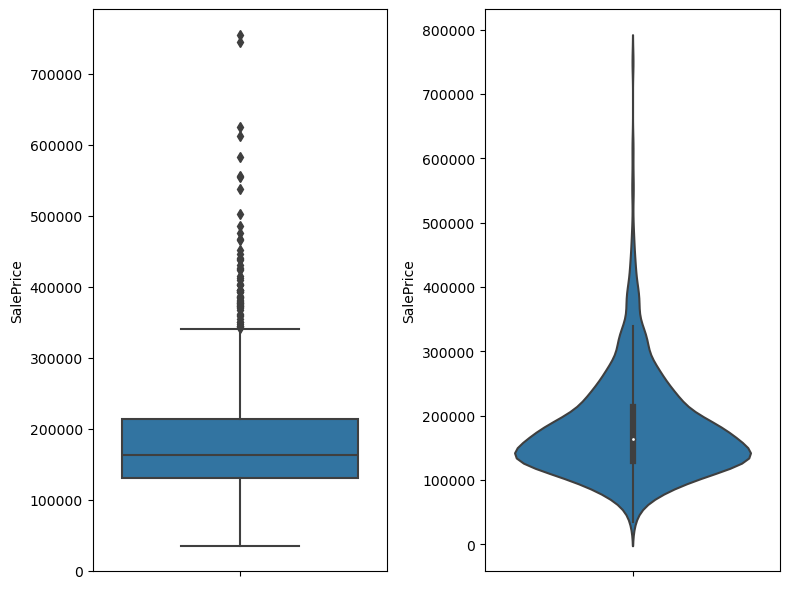

C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be rem

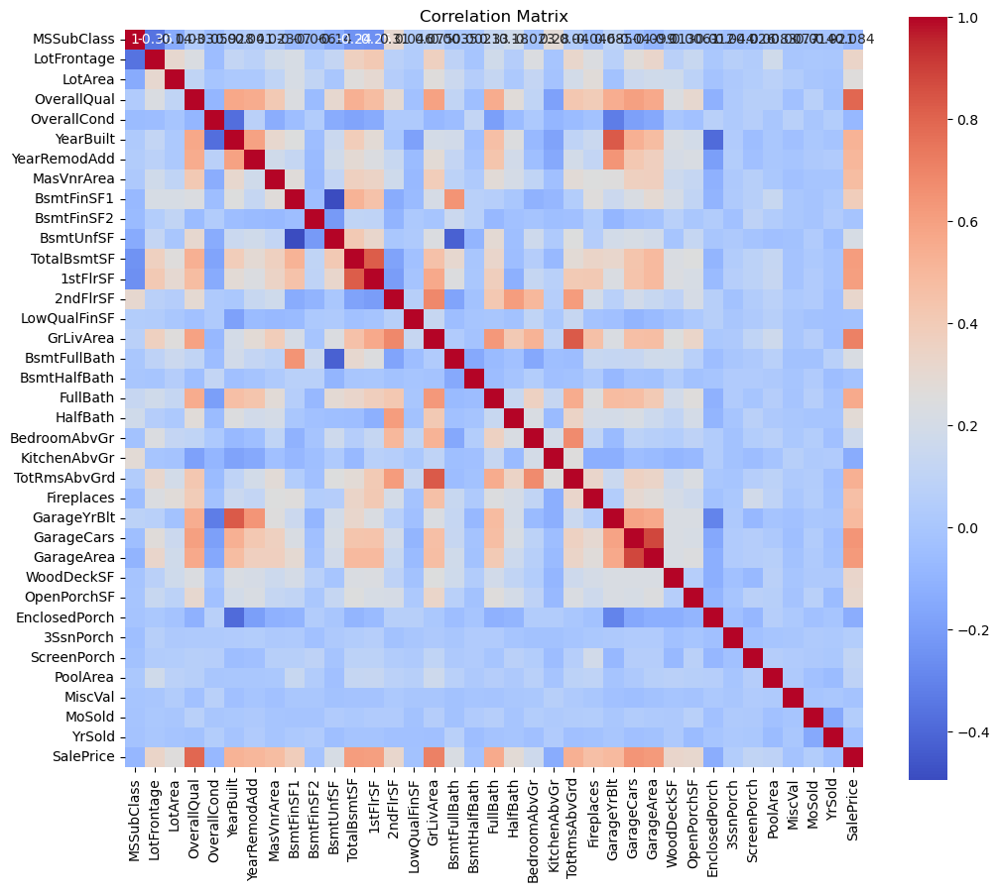

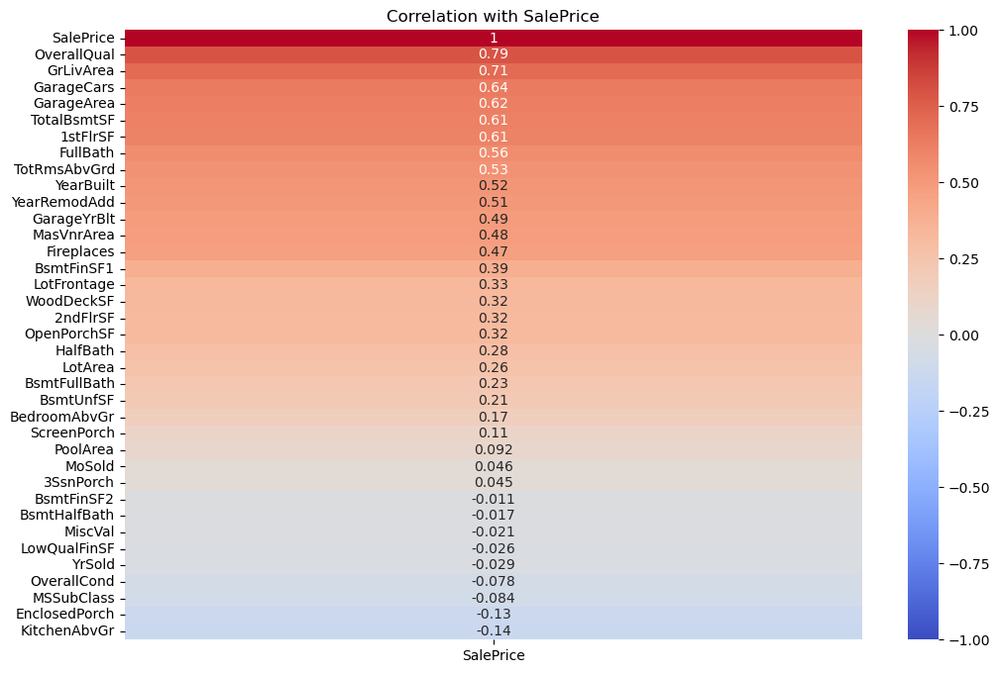

In [22]:
# Creating Function as there are more than 10 columns

# Select numeric columns
numeric_columns = df_with_missing.select_dtypes(include=[np.number]).columns

# Distributions 
for column in numeric_columns:
    plt.figure(figsize=(8, 6))
    plt.hist(df_with_missing[column], bins=30, edgecolor='black')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {column}')
    plt.show()

# Outlier identification (Box Plot, Violin Plot)
for column in numeric_columns:
    plt.figure(figsize=(8, 6))
    plt.subplot(1, 2, 1)
    sns.boxplot(y=column, data=df_with_missing)
    plt.subplot(1, 2, 2)
    sns.violinplot(y=column, data=df_with_missing)
    plt.tight_layout()
    plt.show()

# Pairplots (To see Correlation)
sns.pairplot(df_with_missing[numeric_columns], diag_kind='kde')
plt.show()

# Correlation plots with output variable = 'SalePrice'
correlation_matrix = df_with_missing[numeric_columns].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, square=True)
plt.title('Correlation Matrix')
plt.show()

# HeatMap (To get correlation in metric format)
target_column = 'SalePrice'
plt.figure(figsize=(12, 8))
sns.heatmap(df_with_missing[numeric_columns].corr()[[target_column]].sort_values(by=target_column, ascending=False), 
            cmap='coolwarm', annot=True, vmin=-1, vmax=1)
plt.title('Correlation with SalePrice')
plt.show()

In [24]:
len(numeric_columns)

37

In [26]:
#### Correlation for special feature

C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be rem

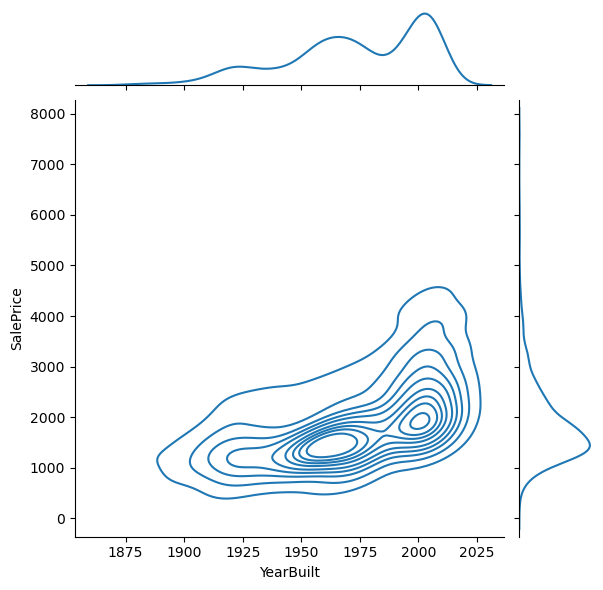

In [30]:
# Copy the DataFrame to avoid modifying the original data
df_adjusted = df_no_missing.copy()

# Adjust "SalePrice" by dividing by 100
df_adjusted['SalePrice'] = df_adjusted['SalePrice'] / 100

# Now plot "YearBuilt" vs the adjusted "SalePrice"
sns.jointplot(x='YearBuilt', y='SalePrice', data=df_adjusted, kind='kde')

plt.show()


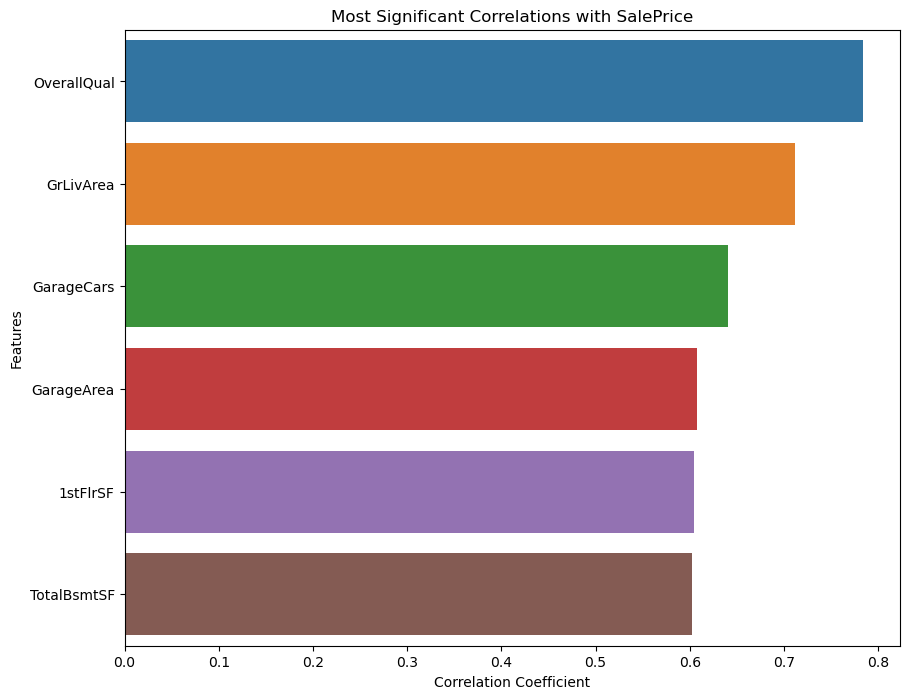

In [33]:
#Compute the correlation matrix for numeric columns only
corr_matrix = df_no_missing[numeric_columns].corr()

#Select and sort the correlations with 'SalePrice'
saleprice_corr = corr_matrix['SalePrice'].sort_values(ascending=False).drop('SalePrice')  # Drop self-correlation

# Defining threshold for correlation
threshold = 0.6
significant_corr = saleprice_corr[(saleprice_corr > threshold) | (saleprice_corr < -threshold)]

#Plot the significant correlations with 'SalePrice'
plt.figure(figsize=(10, 8))
sns.barplot(x=significant_corr.values, y=significant_corr.index)
plt.title('Most Significant Correlations with SalePrice')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.show()


C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be rem

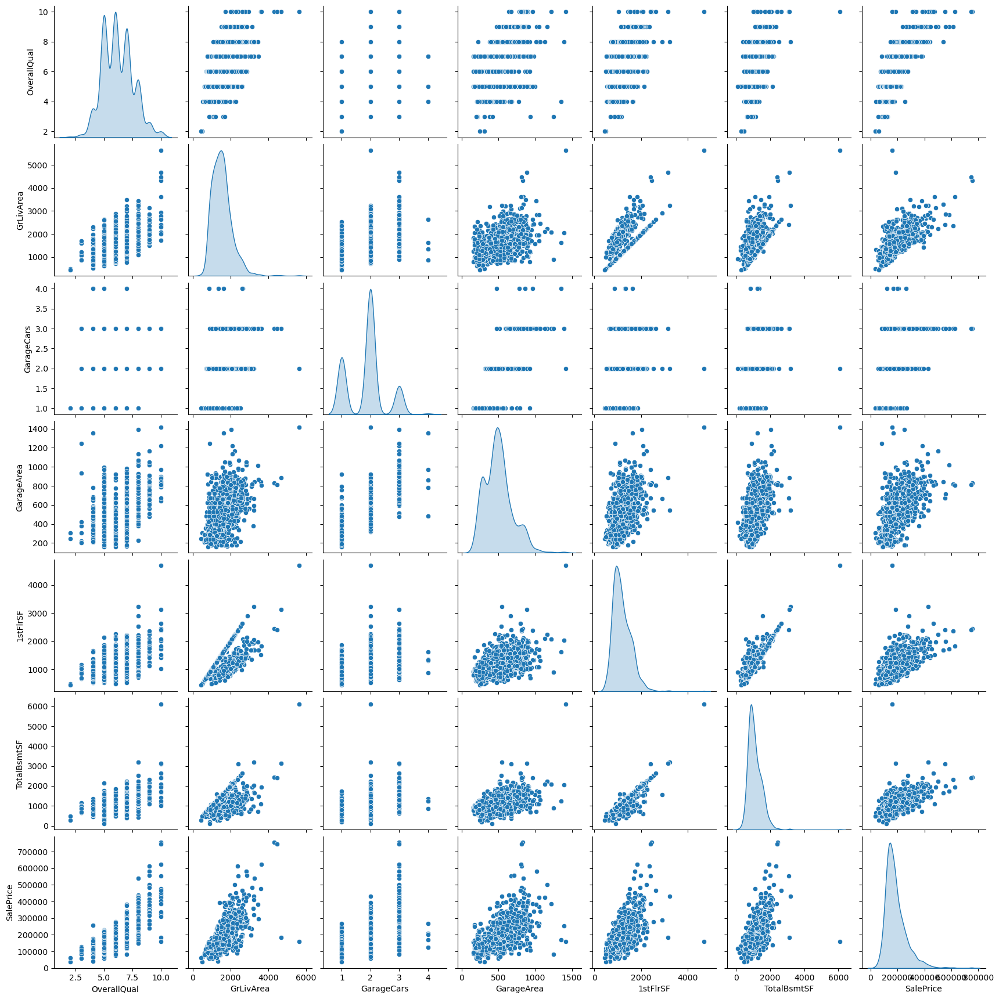

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'significant_corr' contains the sorted, significant correlations from the previous step
# Adding 'SalePrice' to the list of columns to include in the pairplot
columns_for_pairplot = significant_corr.index.tolist() + ['SalePrice']

# Using Seaborn's pairplot function to plot pairwise relationships
# Note: Depending on the number of significant correlations, this plot can be large and may take some time to render
sns.pairplot(df_no_missing[columns_for_pairplot], diag_kind='kde') 

plt.show()


We could see there is skew in the data. We will need to do lognormal transformation

#### Finding outlier distribution in each feature

In [42]:
def calculate_outliers(column):
    Q1 = np.percentile(column, 25)
    Q3 = np.percentile(column, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - (1.5 * IQR)
    upper_bound = Q3 + (1.5 * IQR)
    outliers = column[(column < lower_bound) | (column > upper_bound)]
    num_outliers = len(outliers)
    total_values = len(column)
    outlier_percentage = (num_outliers / total_values) * 100
    return num_outliers, outlier_percentage

# Find outliers in numeric columns
numeric_columns = df_no_missing.select_dtypes(include=[np.number]).columns
outlier_results = []
for column in numeric_columns:
    num_outliers, outlier_percentage = calculate_outliers(df_no_missing[column])
    outlier_results.append((column, num_outliers, outlier_percentage))

# Print the outlier results
print("Outlier Analysis:")
for column, num_outliers, outlier_percentage in outlier_results:
    print(f"{column}: Number of outliers = {num_outliers}, Percentage of outliers = {outlier_percentage:.2f}%")

Outlier Analysis:
MSSubClass: Number of outliers = 88, Percentage of outliers = 6.58%
LotFrontage: Number of outliers = 81, Percentage of outliers = 6.05%
LotArea: Number of outliers = 76, Percentage of outliers = 5.68%
OverallQual: Number of outliers = 0, Percentage of outliers = 0.00%
OverallCond: Number of outliers = 106, Percentage of outliers = 7.92%
YearBuilt: Number of outliers = 7, Percentage of outliers = 0.52%
YearRemodAdd: Number of outliers = 0, Percentage of outliers = 0.00%
MasVnrArea: Number of outliers = 82, Percentage of outliers = 6.13%
BsmtFinSF1: Number of outliers = 6, Percentage of outliers = 0.45%
BsmtFinSF2: Number of outliers = 162, Percentage of outliers = 12.11%
BsmtUnfSF: Number of outliers = 29, Percentage of outliers = 2.17%
TotalBsmtSF: Number of outliers = 20, Percentage of outliers = 1.49%
1stFlrSF: Number of outliers = 17, Percentage of outliers = 1.27%
2ndFlrSF: Number of outliers = 2, Percentage of outliers = 0.15%
LowQualFinSF: Number of outliers = 

#### Highest number of Outliers:

EnclosedPorch: Number of outliers = 183, Percentage of outliers = 13.68%
MasVnrArea: Number of outliers = 82, Percentage of outliers = 6.13%
BsmtHalfBath: Number of outliers = 80, Percentage of outliers = 5.98%

## 4. Categorical Data Exploration

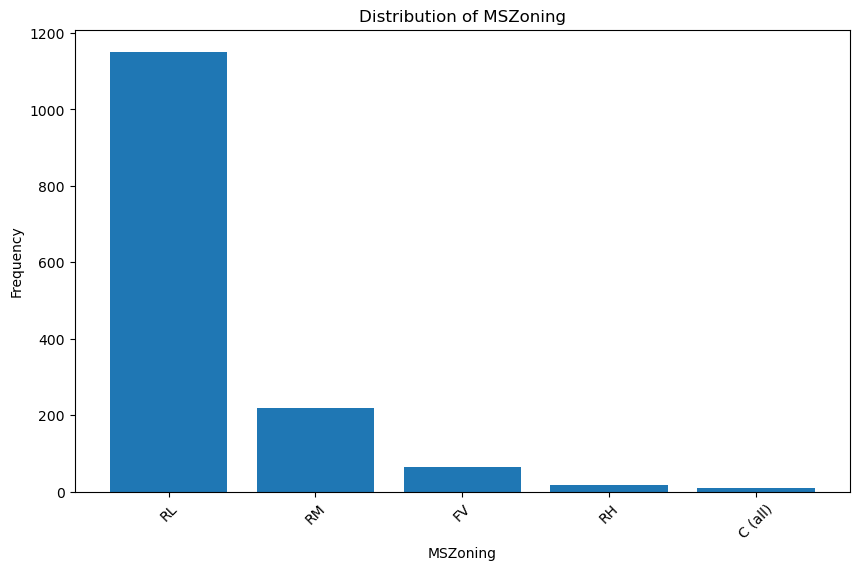

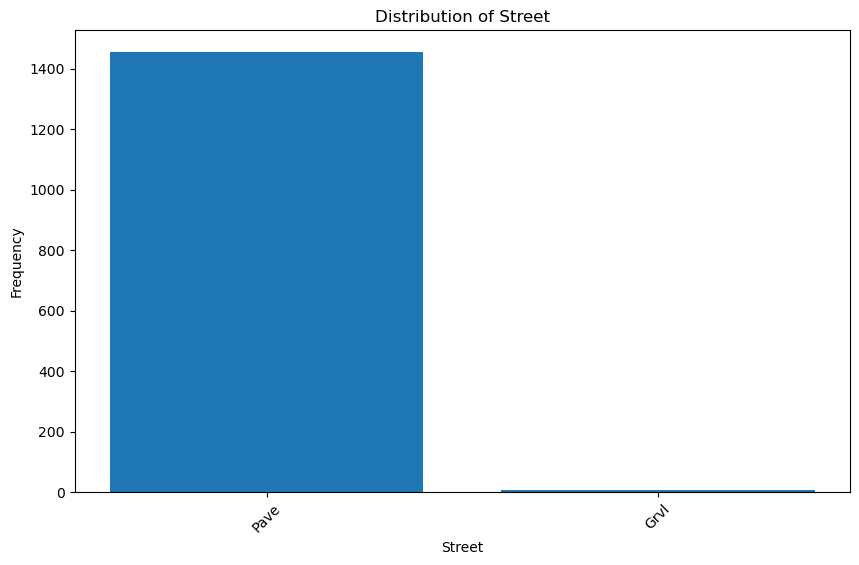

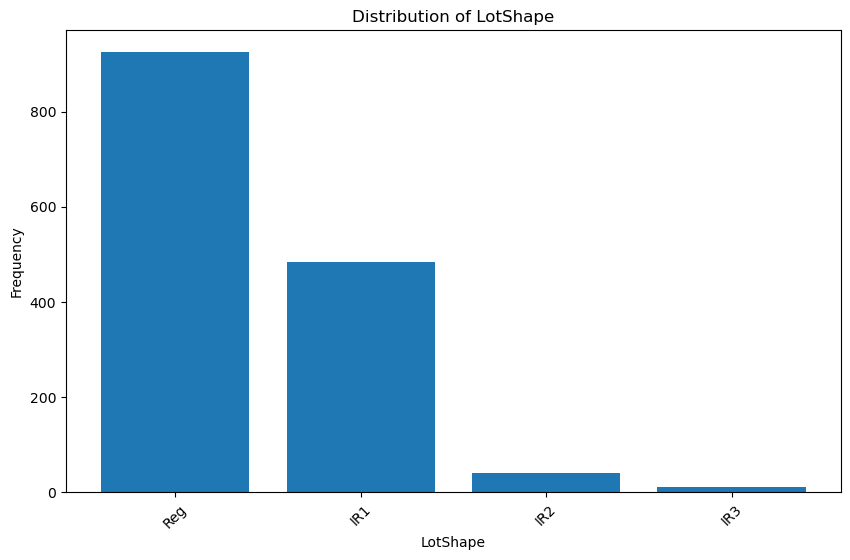

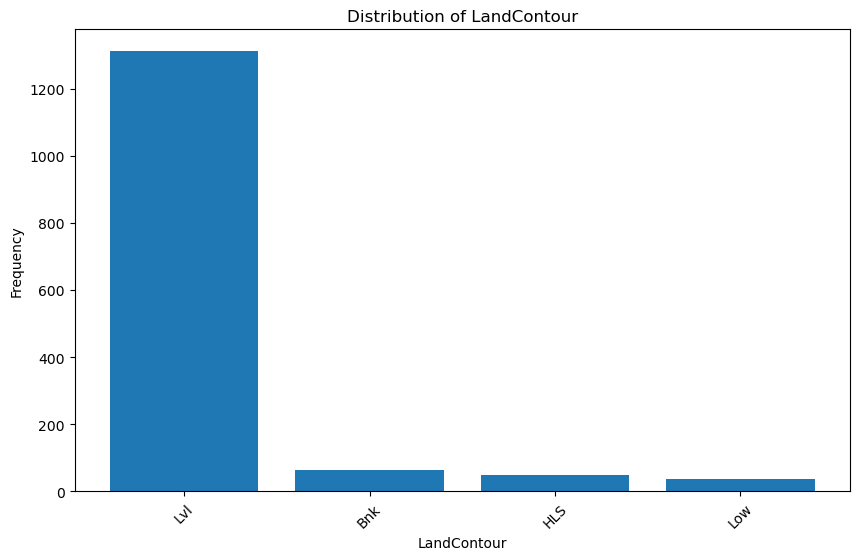

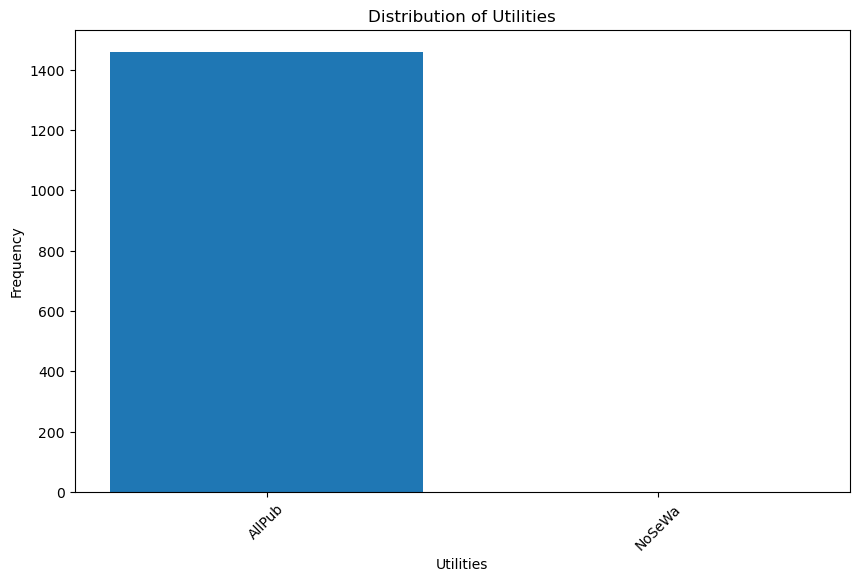

...

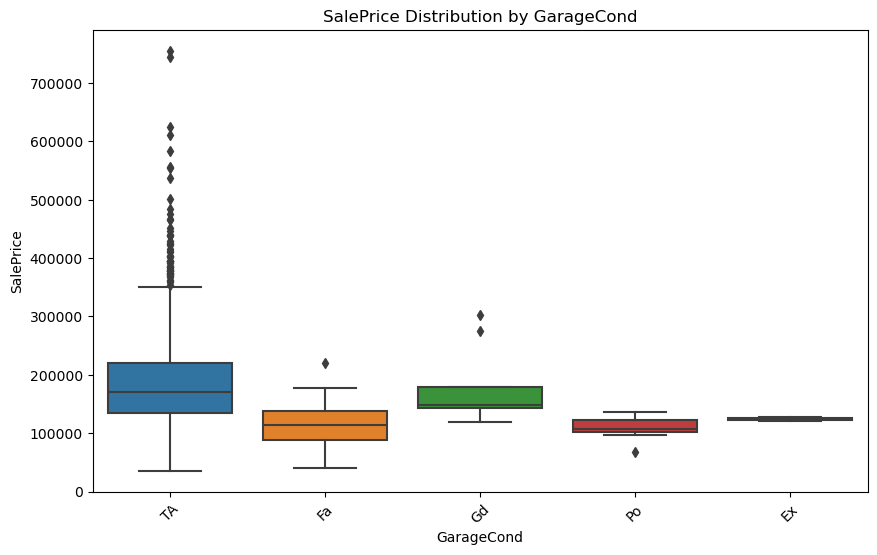

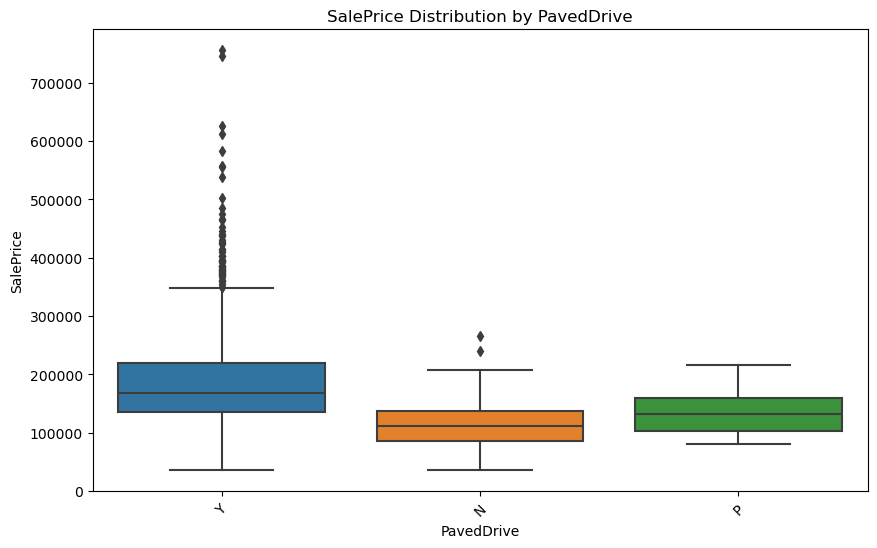

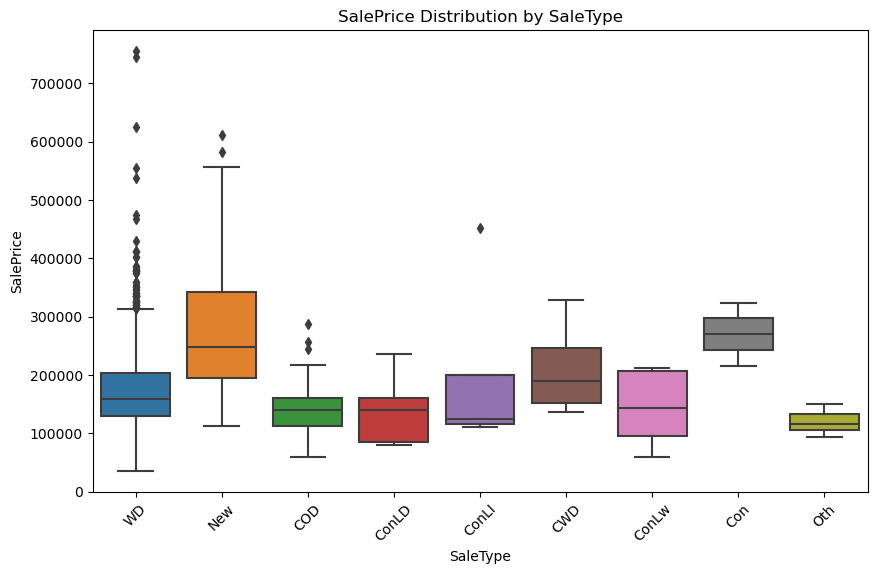

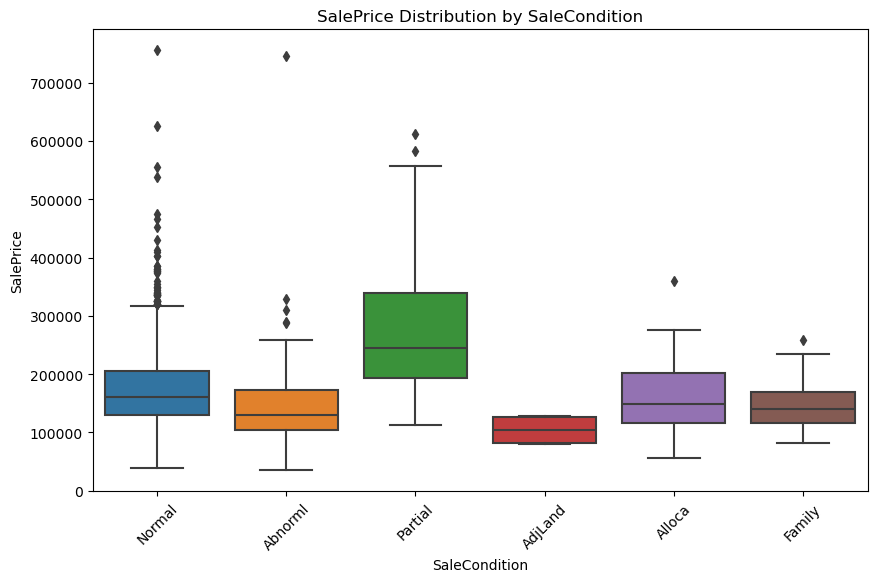

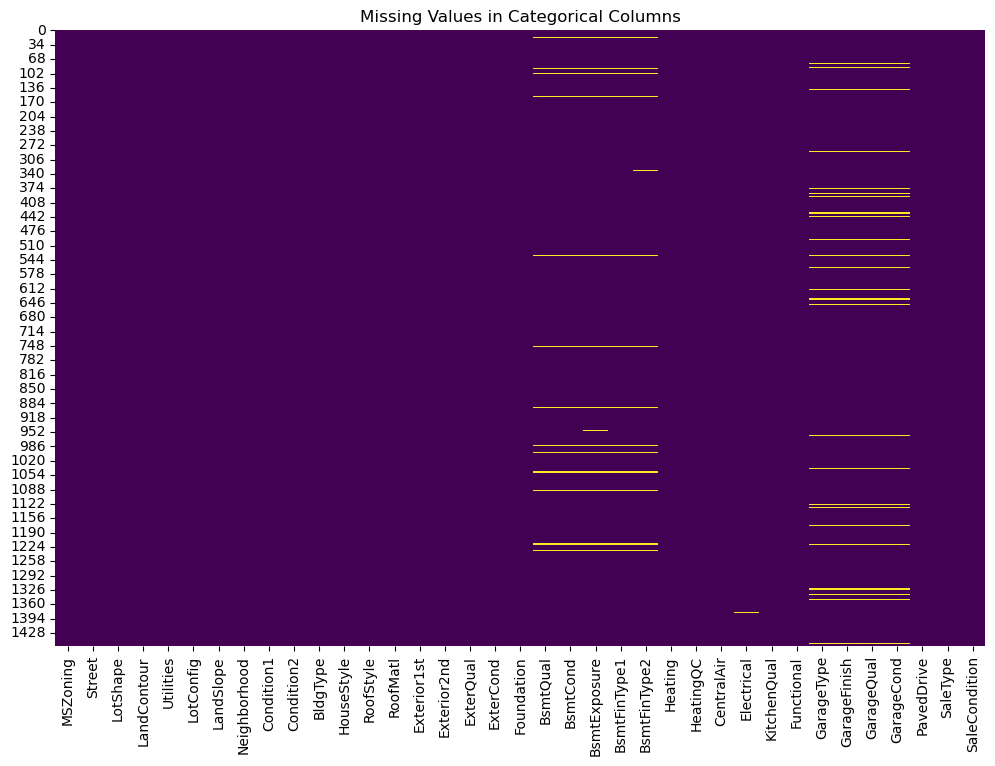

In [25]:


# Select categorical columns
categorical_columns = df_with_missing.select_dtypes(include=['object']).columns

# Distributions
for column in categorical_columns:
    plt.figure(figsize=(10, 6))
    value_counts = df_with_missing[column].value_counts()
    plt.bar(value_counts.index, value_counts.values)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)
    plt.show()

# Boxplot of SalePrice for each categorical variable
for column in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=column, y='SalePrice', data=df_with_missing)
    plt.xticks(rotation=45)
    plt.title(f'SalePrice Distribution by {column}')
    plt.show()

# Heatmap of missing values in categorical columns
plt.figure(figsize=(12, 8))
sns.heatmap(df_with_missing[categorical_columns].isnull(), cmap='viridis', cbar=False)
plt.title('Missing Values in Categorical Columns')
plt.show()

## 5. Data Preparation

### Log Transfer for Numeric Variables

In [45]:
# Standardization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_standardized = df_no_missing.copy()
df_standardized[numeric_columns] = scaler.fit_transform(df_standardized[numeric_columns])

# Normalization (Alternative to Standardization)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_normalized = df_no_missing.copy()
df_normalized[numeric_columns] = scaler.fit_transform(df_normalized[numeric_columns])

# Logarithmic Transformation
df_log_transformed = df_no_missing.copy()
for column in numeric_columns:
    if df_log_transformed[column].min() <= 0:
        df_log_transformed[column] += abs(df_log_transformed[column].min()) + 1
    df_log_transformed[column] = np.log(df_log_transformed[column])

# Print the shape of the standardized, normalized, and log-transformed DataFrames
print("Shape of standardized DataFrame:", df_standardized.shape)
print("Shape of normalized DataFrame:", df_normalized.shape)
print("Shape of log-transformed DataFrame:", df_log_transformed.shape)

Shape of standardized DataFrame: (1338, 74)
Shape of normalized DataFrame: (1338, 74)
Shape of log-transformed DataFrame: (1338, 74)


C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\e1449629\AppData\Local\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be rem

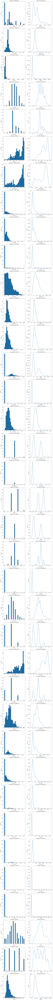

In [46]:
# Creating a figure with subplots
fig, axs = plt.subplots(len(numeric_columns), 2, figsize=(12, 6*len(numeric_columns)))

#Iterating over numeric columns
for i, column in enumerate(numeric_columns):
    #histogram
    axs[i, 0].hist(df_no_missing[column], bins=30, edgecolor='black')
    axs[i, 0].set_xlabel(column)
    axs[i, 0].set_ylabel('Frequency')
    axs[i, 0].set_title(f'Histogram of {column}')

    #KDE plot
    sns.kdeplot(df_no_missing[column], ax=axs[i, 1])
    axs[i, 1].set_xlabel(column)
    axs[i, 1].set_ylabel('Density')
    axs[i, 1].set_title(f'KDE Plot of {column}')


plt.tight_layout()


plt.show()